# Explore lnd_in file (surface data)

In [1]:
# mask the one beneath 60 degrees
# resolution of LPJ GUESS
# set titles and axis, title of the legend
# set caracter bigger
# bare ground? it dipends on the ice retrieve
# polynomial works for longitute? --> just tress btw
# metti lat in vert
# linea sul massimo emostra shift insieme a prec
# mwtti a posto natpdf domnant, no PCT_ etc
# perch esolo range 40-80?

In [2]:
# BOREAL NAT PDFs:
# - 0: Bare Ground
# - 2: NET Boreal
# - 3: NDT Boreal
# - 8: BDT Boreal
# - 11: BDS Boreal
# - 12: artic C3 grass
#Others:
# - 1: NET Temperate
# - 4: BET Tropical
# - 5: BET Temperate
# - 6: BDT Tropical
# - 7: BDT Temperate
# - 9: BES Temperate
# - 10: BDS Temperate
# - 13: C3 grass
# - 14: C4 grass

In [3]:
import numpy as np
import netCDF4 as nc
import xarray as xr; xr.set_options(display_style='html')
import pandas as pd
import os
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import transforms
from matplotlib.colors import ListedColormap
from matplotlib.image import imread
import matplotlib.path as mpath
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import proplot as pplt
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.ticker as cticker
from cartopy.util import add_cyclic_point
from owslib.wms import WebMapService
import warnings; warnings.filterwarnings('ignore')
# My functions 
from dataset_manipulation import *
from plotting import *

#### [Here are Markdown tips](https://towardsdatascience.com/enrich-your-jupyter-notebook-with-these-tips-55c8ead25255)
## <div class="alert alert-success">Import and prepare the dataset</div>

In [4]:
# Import surface data file: 
fn='../data/surfdata_1.9x2.5_hist_78pfts_CMIP6_simyr2000_c190304.nc'
dset_in = xr.open_dataset(fn)

# Explore the imported dataset with its variables etc...
display(dset_in)
# It's a three dimensional dset:
# - time
# - cft: number of CropFT
# - natpft: number of PlantFT
# and other dimensions
# variables: https://noresm-docs.readthedocs.io/en/latest/output/clm_standard_out.html

#Convert Land Surface coord to normal coord
dset_in = convert_lsmcoord(dset_in)
#Convert longitude [0,360] -> [-180,180]
dset_in = convert360_180(dset_in)
#Save the manipulated dataset
folder_out="data_out/"
#dset_in.load().to_netcdf(folder_out+'dset_tot.nc')

# Land fraction based on PFT dataset
lnd_frac=dset_in.LANDFRAC_PFT
lnd_frac.load().to_netcdf(folder_out+'lnd_frac.nc')

# Select PFT: percent plant functional type on the natural veg landunit (% of landunit)
# OBS! variable is centered, related to the ammount of land (full coloured even if )
pfts = dset_in.PCT_NAT_PFT
dset_in.load().to_netcdf(folder_out+'pfts.nc')

display(pfts)

<xarray.Dataset>
Dimensions:                  (lsmlat: 96, lsmlon: 144, nlevsoi: 10, natpft: 15, cft: 64, time: 12, lsmpft: 79, numurbl: 3, numrad: 2, nlevurb: 5, nglcecp1: 11, nglcec: 10)
Coordinates:
  * natpft                   (natpft) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14
  * cft                      (cft) int32 15 16 17 18 19 20 ... 73 74 75 76 77 78
  * time                     (time) int32 1 2 3 4 5 6 7 8 9 10 11 12
Dimensions without coordinates: lsmlat, lsmlon, nlevsoi, lsmpft, numurbl, numrad, nlevurb, nglcecp1, nglcec
Data variables: (12/77)
    mxsoil_color             int32 ...
    SOIL_COLOR               (lsmlat, lsmlon) int32 ...
    PCT_SAND                 (nlevsoi, lsmlat, lsmlon) float64 ...
    PCT_CLAY                 (nlevsoi, lsmlat, lsmlon) float64 ...
    ORGANIC                  (nlevsoi, lsmlat, lsmlon) float64 ...
    FMAX                     (lsmlat, lsmlon) float64 ...
    ...                       ...
    CONST_HARVEST_SH2        (lsmlat, lsmlon) float64 ...
    CONST_HARVEST_SH3        (lsmlat, lsmlon) float64 ...
    CONST_GRAZING            (lsmlat, lsmlon) float64 ...
    CONST_FERTNITRO_CFT      (cft, lsmlat, lsmlon) float64 ...
    UNREPRESENTED_PFT_LULCC  (natpft, lsmlat, lsmlon) float64 ...
    UNREPRESENTED_CFT_LULCC  (cft, lsmlat, lsmlon) float64 ...
Attributes: (12/47)
    Conventions:                          NCAR-CSM
    History_Log:                          created on: 03-04-19 21:18:12
    Logname:                              erik
    Host:                                 cheyenne3
    Source:                               Community Land Model: CLM5
    Version:                              release-clm5.0.18/gpfs/fs1/scratch/...
    ...                                   ...
    Soil_texture_raw_data_file_name:      mksrf_soitex.10level.c010119.nc
    Soil_color_raw_data_file_name:        mksrf_soilcolor_CMIP6_simyr2005.c17...
    Fmax_raw_data_file_name:              mksrf_fmax_3x3min_USGS_c120911.nc
    Organic_matter_raw_data_file_name:    mksrf_organic_10level_5x5min_ISRIC-...
    Lai_raw_data_file_name:               mksrf_lai_78pfts_simyr2005.c170413.nc
    Vegetation_type_raw_data_filename:    mksrf_landuse_histclm50_LUH2_2000.c...

<xarray.DataArray 'PCT_NAT_PFT' (natpft: 15, lat: 96, lon: 144)>
array([[[100.        , 100.        , 100.        , ..., 100.        ,
         100.        , 100.        ],
        [100.        , 100.        , 100.        , ..., 100.        ,
         100.        , 100.        ],
        [100.        , 100.        , 100.        , ...,  99.74730194,
         100.        , 100.        ],
        ...,
        [100.        , 100.        , 100.        , ..., 100.        ,
         100.        , 100.        ],
        [100.        , 100.        , 100.        , ..., 100.        ,
         100.        , 100.        ],
        [100.        , 100.        , 100.        , ..., 100.        ,
         100.        , 100.        ]],

       [[  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
...
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ]],

       [[  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.25269806,
           0.        ,   0.        ],
        ...,
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ],
        [  0.        ,   0.        ,   0.        , ...,   0.        ,
           0.        ,   0.        ]]])
Coordinates:
  * natpft   (natpft) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14
  * lat      (lat) float64 -90.0 -88.11 -86.21 -84.32 ... 84.32 86.21 88.11 90.0
  * lon      (lon) float64 -180.0 -177.5 -175.0 -172.5 ... 172.5 175.0 177.5
Attributes:
    long_name:  percent plant functional type on the natural veg landunit (% ...
    units:      unitless

### <div class="alert alert-info">Comments:</div>
- **check the version of the file**: look in the attribute. Where there are all the source files where the values come from
- **name of several isoprene - BVOC**: `EF_*`
- also: albedo, PFT gross LULCC, LAI, other PFT related


- **convert ls-coord (Land Surface Coord) into normal coord lon-lat** - <span style="color:gray">another JupNotebook on this topic</span>
- **covert longitude from [0,360] to [-180, 180]**: [eScience tips](https://nordicesmhub.github.io/forces-2021/learning/example-notebooks/some-xarray-pandas-presentation_Sara.html) and [here to `sortby('lon')`](https://stackoverflow.com/questions/53121089/regridding-coordinates-with-python-xarray). My version also makes a copy, orders, keeps the attributes.
- **save Dataset Xarray to netcdf files**: `.load().to_netcdf` (following [eScience tips](https://nordicesmhub.github.io/forces-2021/learning/example-notebooks/save_to_forces_bucket.html))

## <div class="alert alert-success">List of PFTs</div>

| **natpft** | **napft_name**  |
|------------|-----------------|
| **0**      | Bare Ground     |
| **1**      | Temperate NET   |
| **2**      | Boreal NET      |
| **3**      | Boreal NDT      |
| **4**      | Tropical BET    |
| **5**      | Temperate BET   |
| **6**      | Tropical BDT    |
| **7**      | Temperate BDT   |
| **8**      | Boreal BDT      |
| **9**      | Temperate BES   |
| **10**     | Temperate BDS   |
| **11**     | Boreal BDS      |
| **12**     | Arctic C3 grass |
| **13**     | C3 grass        |
| **14**     | C4 grass        |

In [5]:
pft_names = {0:'Bare Ground', 1:'TeNET', 2:'BoNET', 3:'BoNDT', 4:'TrBET', 5:'TeBET', 6:'TrBDT', 
             7:'TeBDT', 8:'BoBDT', 9:'TeBES', 10:'TeBDS', 11:'BoBDS', 12:'arcticC3', 13:'C3', 14:'C4'}
pft_bg = [0]
pft_grass = [12,13,14]
pft_shrubs = [9,10,11]
pft_trees = [1,2,3,4,5,6,7,8]

## <div class="alert alert-success">Maps – overview on PFTs</div>
<span style="color:red"> **OBS! FILTER OVER THE OCEAN**: when evaluating the mean I consider **0 land** without that PFT and **NaN the ocean**. </span>

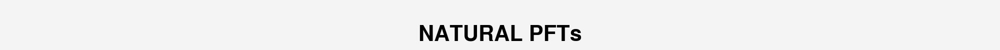

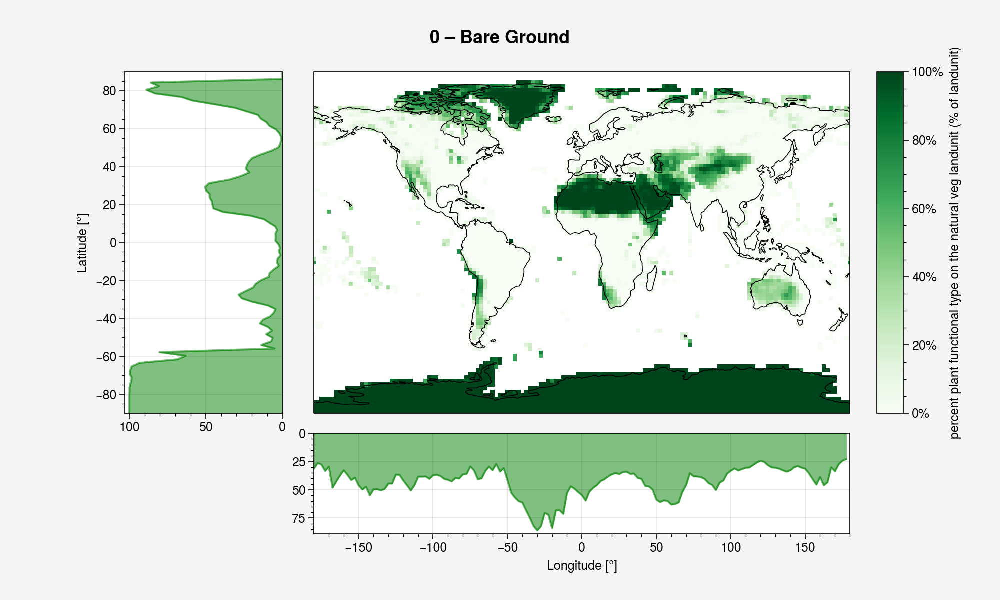

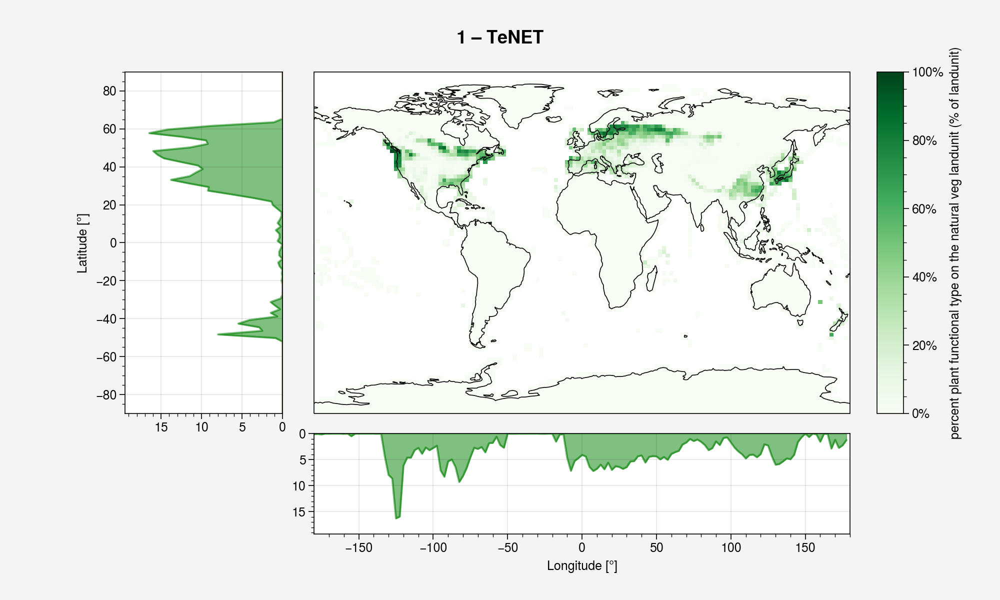

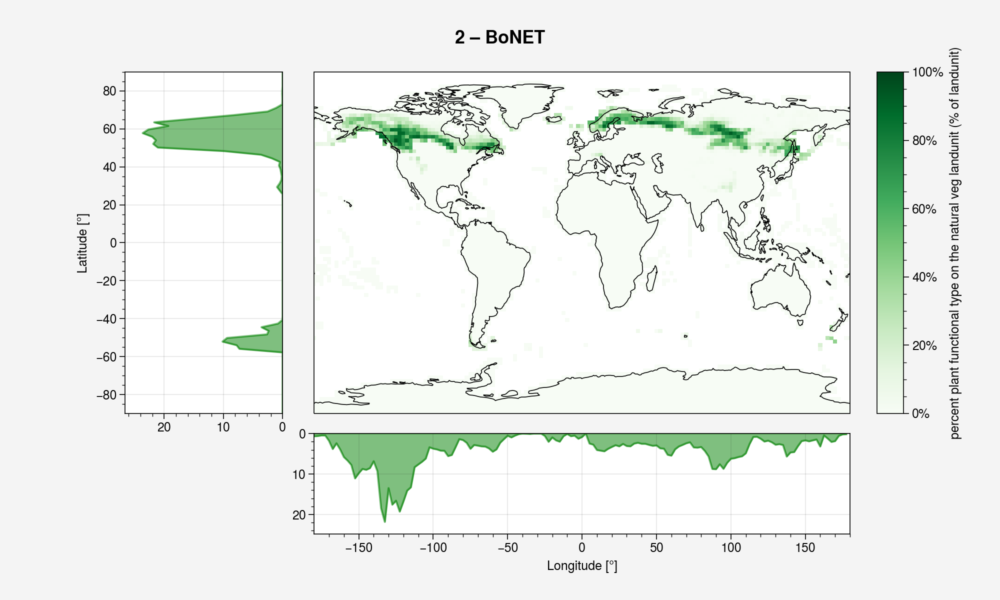

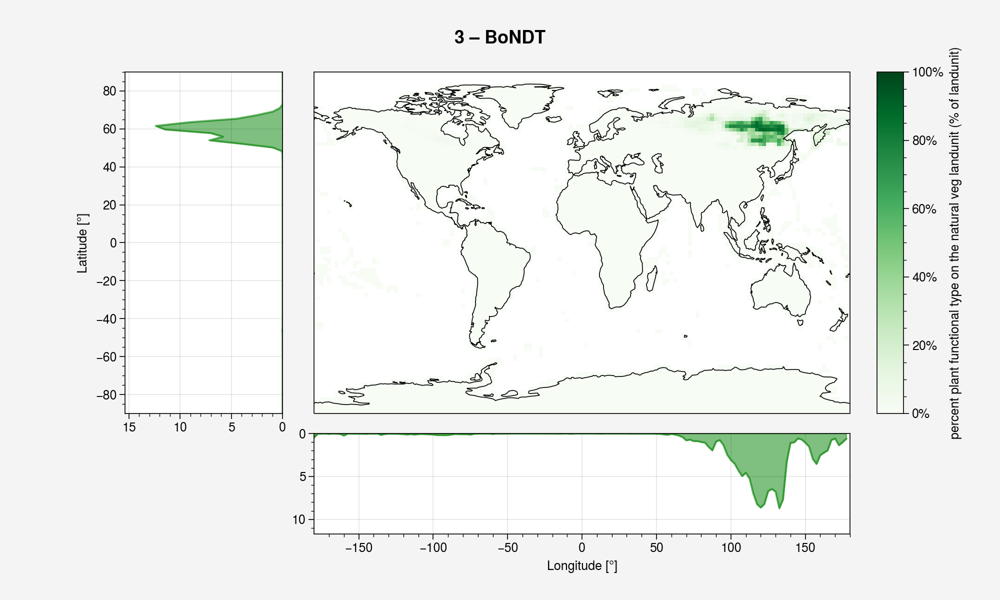

...

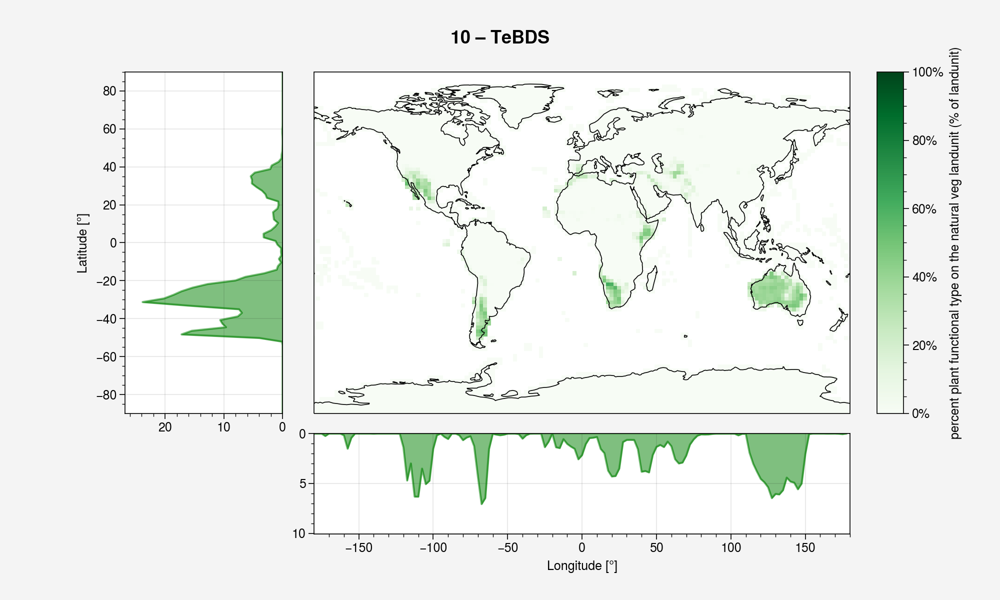

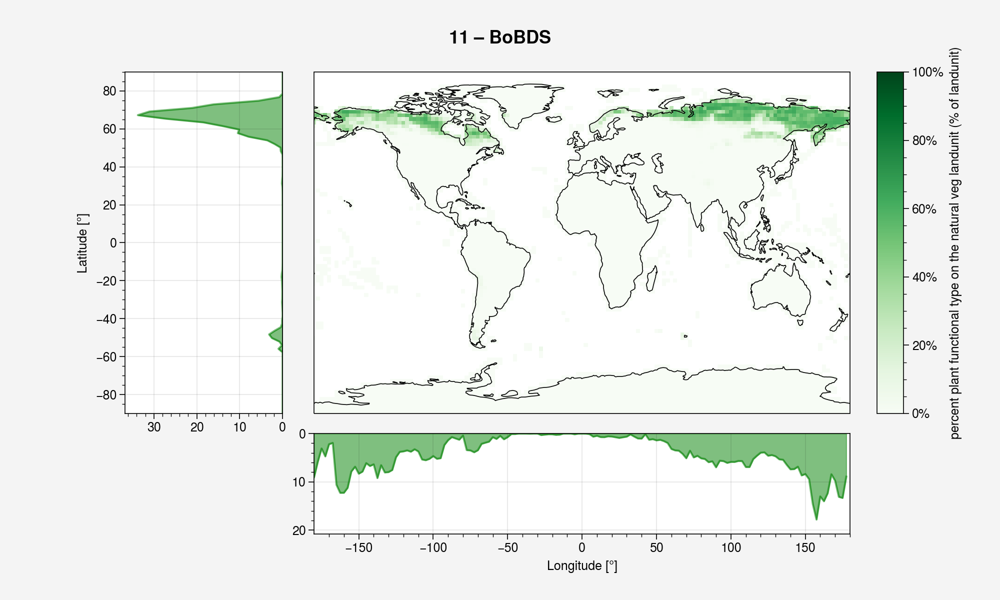

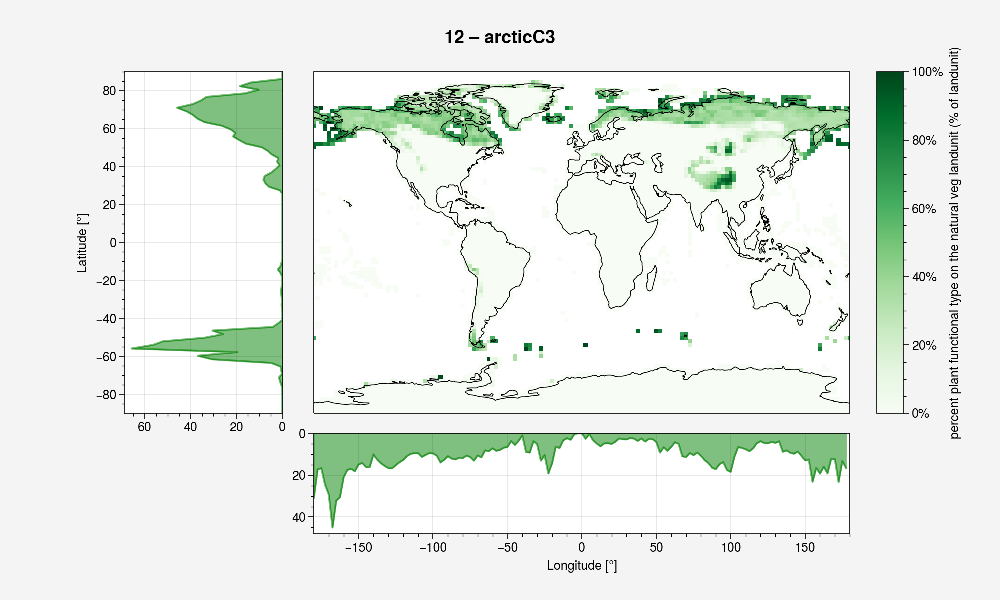

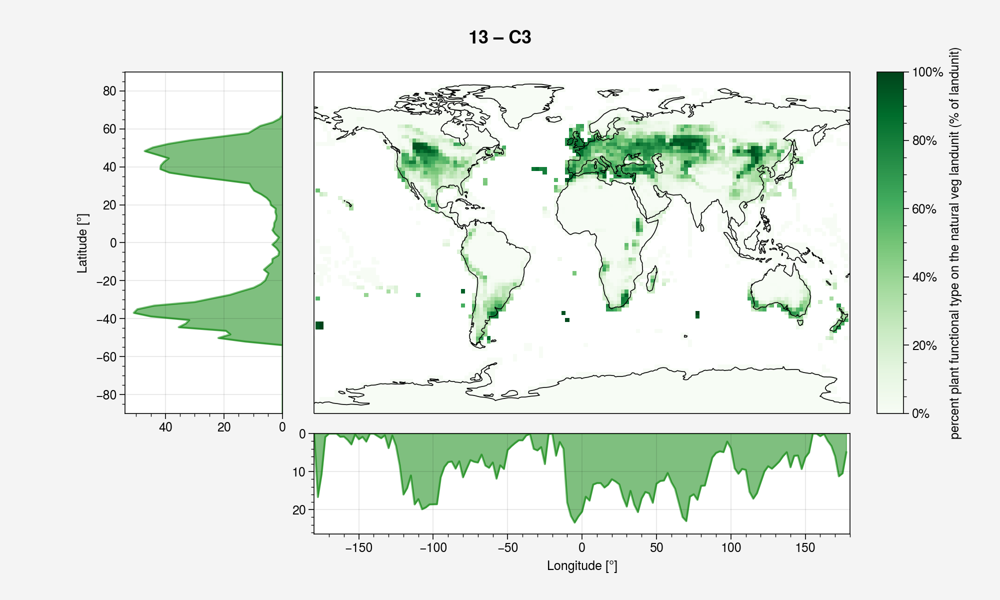

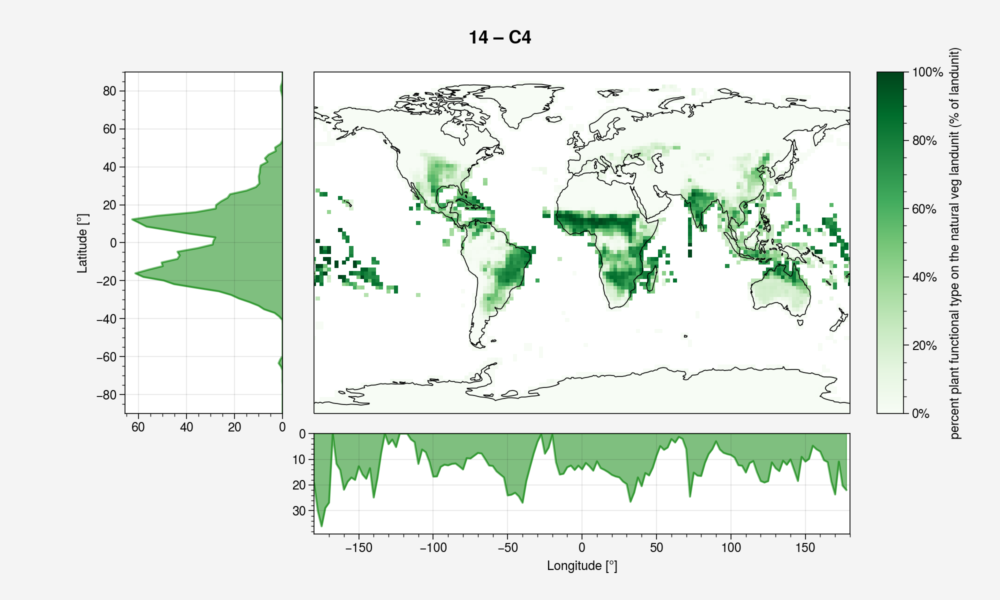

In [6]:
# Fancy title
fig = plt.figure(figsize=(10, 0.5))
grid = plt.GridSpec(1, 1)
ax = fig.add_subplot(grid[:, :])
ax.axis('off')
plt.suptitle('NATURAL PFTs', weight='bold', size='xx-large', y=0.5)
plt.tight_layout()
plt.show()

for n in range(0,14+1):
    ds = pfts.sel(natpft=n).drop('natpft')
    title = str(n)+' – '+pft_names[n]
    
    map_lonlatdistribution(ds, lnd_frac, title)

### <div class="alert alert-info">Comments:</div>
- **`GridSpec`**: maps + lon/lat distribution + colorbar in a single plot. Here is [documentation](https://matplotlib.org/stable/api/_as_gen/matplotlib.gridspec.GridSpec.html) and [user guide](https://matplotlib.org/stable/tutorials/intermediate/arranging_axes.html) and [inspiration for this one](https://www.oreilly.com/library/view/python-data-science/9781491912126/ch04.html)-> need to deepen the order of the spec
- **add the colorbar to `GridSpec`** - here is the [recipe](https://matplotlib.org/3.1.1/gallery/axes_grid1/demo_colorbar_with_inset_locator.html) 
- set **colorbar limits**: `vim` and `vmax`
- change **format colorbar ticks - percentage**: `format='%.0f%%'`. Other arguments [here](https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.pyplot.colorbar.html) and to have the percentage format (from 0.1 -> 10%) [here](https://stackoverflow.com/questions/34820239/seaborn-heatmap-colorbar-label-as-percentage).
- `main_ax.set_aspect('auto')` rescales the rigid `ccrs.PlateCarree()`
- remember to filter NaN values, in the mean can lead to mistakes
- plot a **[vertical oriented area chart](https://stackoverflow.com/questions/50802556/how-to-plot-a-vertical-area-plot-with-pandas)** (mission impossible completed ✅). Note: `stacked=False` 
- **`plt.gca()`** means [*get corrent axis*](https://stackoverflow.com/questions/45381589/how-does-plt-gca-work-internally)
- **Empty axis**: `ax.axis('off')` or `ax.set_visible(False)` hide the axis already created
- **Invert axis orientation**: `ax.invert_yaxis()`
- **Rename a series**: `.rename_axis(name)`

## <div class="alert alert-success">Select PFTs in the boreal zone</div>

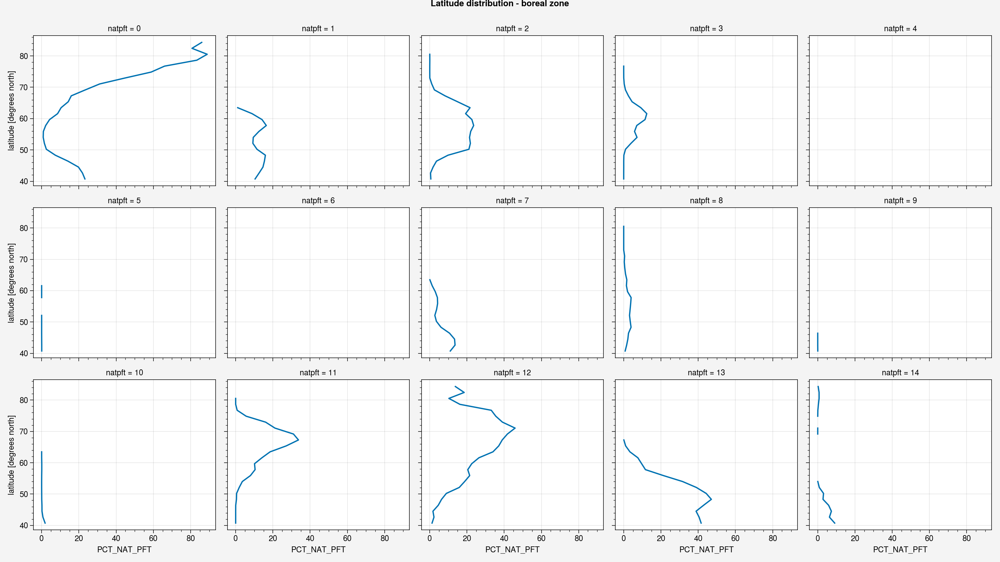

In [7]:
boreal_lat = 45.
#taken from LPGJ_GUESS paper
boreal_lat = 48.
#https://www.researchgate.net/publication/280530183_The_Boreal_Climate
boreal_lat = 40.
#to be conservative and look at the sub-boreal as well

c = pfts.sel(lat=slice(boreal_lat,90)).where(lnd_frac>0.).mean('lon')
c.where(c>0.).plot(y='lat',col='natpft', col_wrap=5)
plt.suptitle("Latitude distribution - boreal zone", y=1)
plt.tight_layout()
plt.show()
#c=c.fillna(0.)

###### Longitude distribution:###########
#c = pfts.where(pfts.lat>boreal_lat).dropna('lat', how='all').mean('lat')
#c.where(lnd_frac>0.).plot(col='natpft', col_wrap=3)
#plt.suptitle("Longitude distribution - boreal zone", y=1)
#plt.tight_layout()
#plt.show()

The 0 values were subsitute by NaN values to highlight the absence of each PFT.

From these plots we see:
- BOREAL: 0,2,3,11,12
- BOREAL but little relevant: 8
- NOT BOREAL but can contribute ("SUB_BOREAL"): 1,7,13

In [8]:
# BOREAL NAT PDFs:
# - 0: Bare Ground
# - 2: NET Boreal
# - 3: NDT Boreal
# - 8: BDT Boreal
# - 11: BDS Boreal
# - 12: artic C3 grass
#Others:
# - 1: NET Temperate
# - 4: BET Tropical
# - 5: BET Temperate
# - 6: BDT Tropical
# - 7: BDT Temperate
# - 9: BES Temperate
# - 10: BDS Temperate
# - 13: C3 grass
# - 14: C4 grass

# BOREAL PFTs:
bpft_names_tot = {0:'Bare Ground', 2:'BoNET', 3:'BoNDT', 8:'BoBDT', 11:'BoBDS', 12:'arcticC3'}
bpft_names = {2:'BoNET', 3:'BoNDT', 8:'BoBDT', 11:'BoBDS', 12:'arcticC3'}
bpft_bg = [0]
bpft_grass = [12]
bpft_shrubs = [11]
bpft_trees = [2,3,8]
bpfts = bpft_trees+bpft_shrubs+bpft_grass
bpfts_tot = bpft_bg+bpfts

# SUB BOREAL PFTs:
sbpft_names = {1:'TeNET', 7:'TeBDT', 13:'C3'}
sbpft_grass = [13]
sbpft_trees = [1,7]


sbpfts = bpfts+sbpft_grass+sbpft_trees
sbpfts.sort()

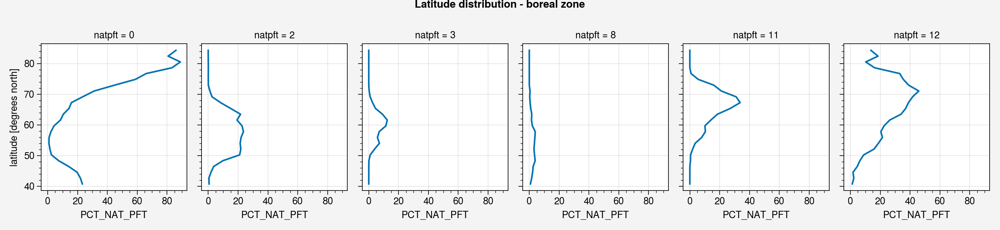

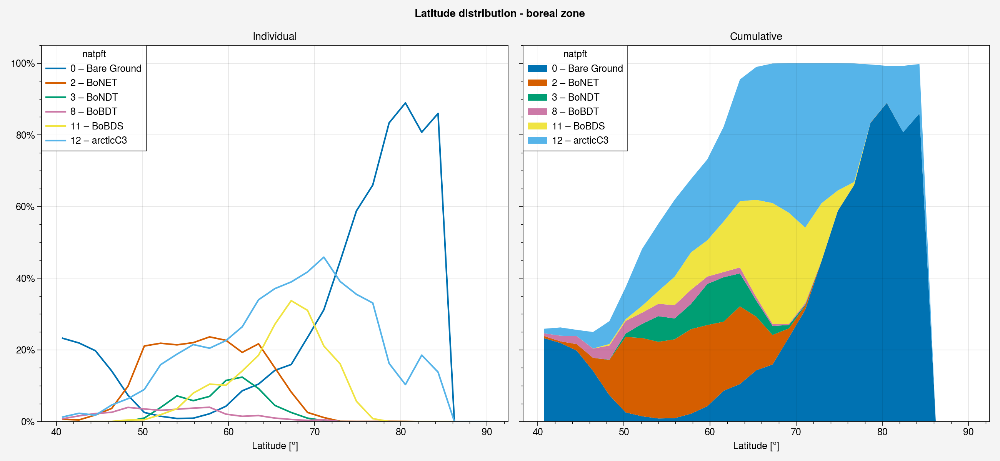

In [9]:
bc = c.sel(natpft=bpfts_tot)
bc.plot(y='lat',col='natpft', figsize=[13,3])
plt.suptitle("Latitude distribution - boreal zone", y=1)
plt.tight_layout()
plt.show()

bc = bc.fillna(0.)
fig, axes = plt.subplots(1,2,figsize=(13, 6), sharex= True, sharey=True)
bc.T.to_series().unstack().plot(ax=axes[0], stacked=False, title="Individual") #plot.area
axes[0].legend(dict_to_legend(bpft_names_tot), title='natpft')

axes[1].stackplot(bc.lat, bc)
axes[1].legend(dict_to_legend(bpft_names_tot), title='natpft', loc='upper left')
axes[1].set_title("Cumulative")

for b, ax in enumerate(axes.flat):
    vals = ax.get_yticks()
    ax.set_yticklabels(['{0:g}%'.format(x) for x in vals])
    ax.set_xlabel("Latitude [°]")
    #ax.set_xlim(40,84)

plt.suptitle("Latitude distribution - boreal zone")

plt.tight_layout()
plt.show()

### <div class="alert alert-info">Comments:</div>
- **Dictionary**: `.keys()`, `.values()`, `.item()`, `.ammount()`. Here [examples](https://www.w3schools.com/python/python_dictionaries_access.asp) of accessing dicts.
- Format use and **fancy legend** (`"{item} - {amount}`):

`def dict_to_legend(dct):
    return ["{} – {}".format(item, amount) for item, amount in dct.items()]`
- **`FacetGrid`** is seaborn functionality, you can pass directly `figsize` or `add_titles`. Here [documentation](https://docs.xarray.dev/en/stable/generated/xarray.plot.FacetGrid.html)
- Set **figure parameters**: `plt.rcParams["figure.figsize"] = (20,10)`. Here [all parameters](https://matplotlib.org/stable/tutorials/introductory/customizing.html) one can set a posteriori.

## Bare Ground: yes or no?

Filter just bareground on land (`dset_in.LANDFRAC_PFT`).

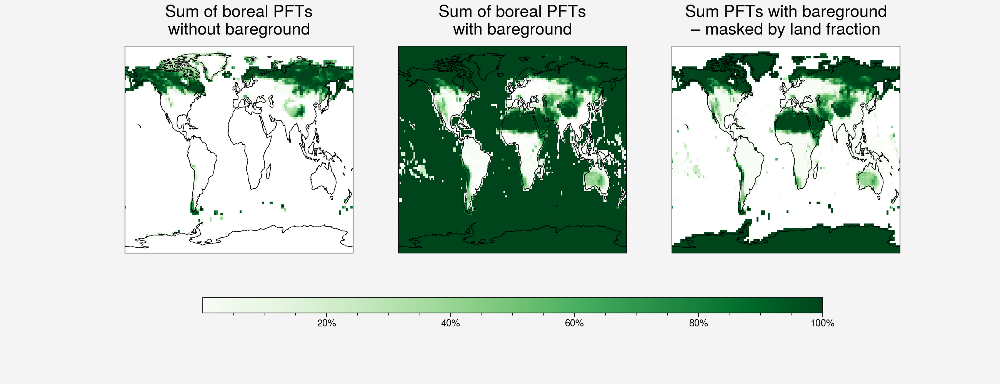

In [10]:
fig, axes = plt.subplots(1,3,figsize=(13, 5), sharex= True, sharey=True, subplot_kw=dict(projection=ccrs.PlateCarree()))

pfts_b=pfts.sel(natpft=bpfts)
pfts_b_sum = pfts_b.sum('natpft', keep_attrs=True)
p=pfts_b_sum.where(pfts_b_sum>0.).plot.pcolormesh(ax=axes[0], add_colorbar=False, cmap='Greens')
axes[0].set_title("Sum of boreal PFTs\nwithout bareground",y=1.03, size='xx-large')

pfts_b=pfts.sel(natpft=bpfts_tot)
pfts_b_sum = pfts_b.sum('natpft', keep_attrs=True)
pfts_b_sum.where(pfts_b_sum>0.).plot.pcolormesh(ax=axes[1],add_colorbar=False, cmap='Greens')#,transform=ccrs.PlateCarree())
axes[1].set_title("Sum of boreal PFTs\nwith bareground",y=1.03, size='xx-large')

pfts_b_sum.where(lnd_frac>0.).plot.pcolormesh(add_colorbar=False, cmap='Greens', ax=axes[2])
axes[2].set_title("Sum PFTs with bareground\n– masked by land fraction",y=1.03, size='xx-large')


for b, ax in enumerate(axes.flat):
    ax.set_global()
    ax.coastlines()
    ax.set_aspect('auto')

fig.colorbar(p, ax=axes.ravel().tolist(), location = 'bottom', shrink=0.8, aspect=40,format='%.0f%%')
    
plt.tight_layout()
plt.show()

### Create boreal datasets to work on : select boreal pfts and boreal region

<span style="color:red">For a first analysis, **I will consider no bareground**, but all ready to be included.</span>

Create 3 datasets:
- Boreal PFTs: `boreal_pfts`
- Boreal BG: `boreal_bg`
- Sub Boreal PFTs: `subboreal_pfts`

*Filter*: NaN values on ocean, 0. values on land

In [11]:
def select_boreal_region(dset, npft, boreal_lat, lnd_frac):
    """Filter the boreal region (above boreal_lat) and select the boreal PFTs. 
    This function specifically needs land_frac to filter, but it can be edited more general."""
    
    br = dset.sel(natpft=npft).where(lnd_frac>0.)
    br = br.sel(lat=slice(boreal_lat,90))#where(br.lat>boreal_lat)#.dropna('lat', how='all')
    return br

boreal_pfts=select_boreal_region(pfts, npft=bpfts, boreal_lat=boreal_lat, lnd_frac=lnd_frac)
boreal_bg=select_boreal_region(pfts, npft=0, boreal_lat=boreal_lat, lnd_frac=lnd_frac)
subboreal_pfts=select_boreal_region(pfts, npft=sbpfts, boreal_lat=boreal_lat, lnd_frac=lnd_frac)

boreal_pfts.load().to_netcdf(folder_out+'boreal_pfts.nc')
boreal_bg.load().to_netcdf(folder_out+'boreal_bg.nc')
subboreal_pfts.load().to_netcdf(folder_out+'subboreal_pfts.nc')

## <div class="alert alert-success">Boreal PFTs maps</div>

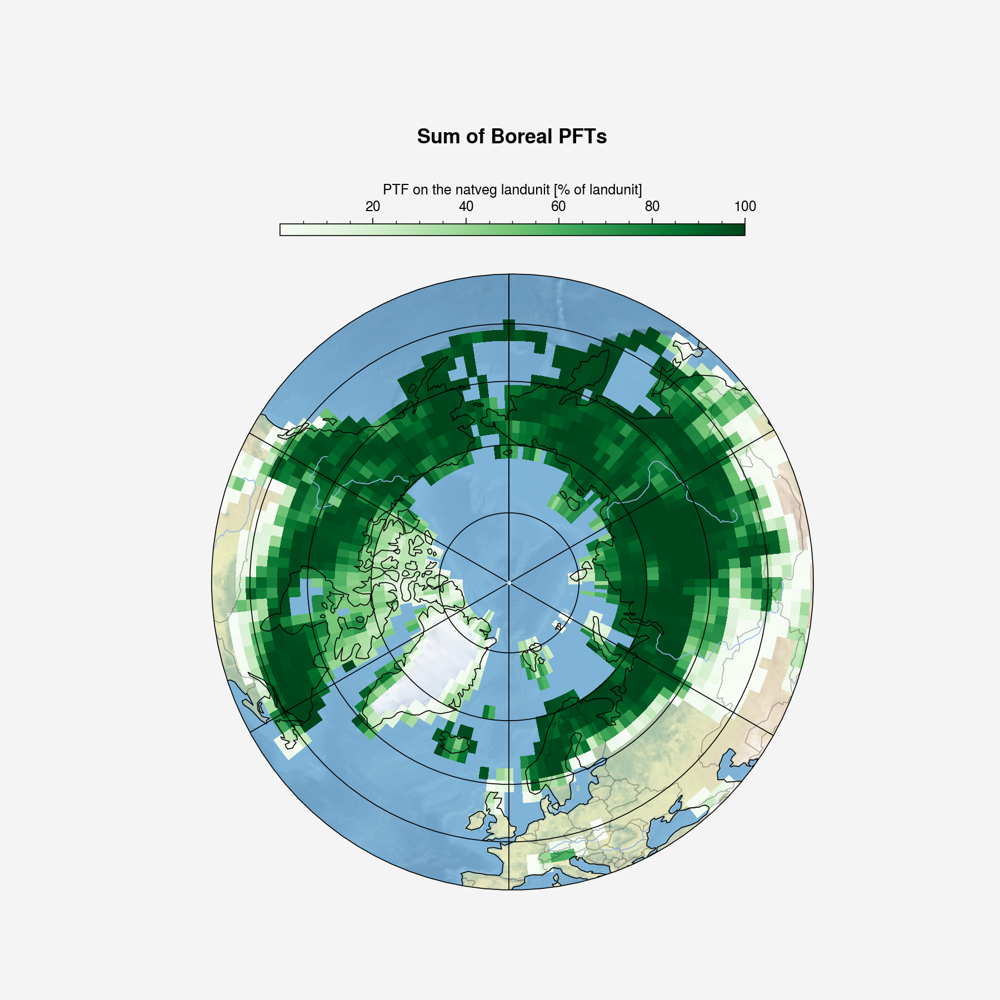

In [12]:
#Note: this is the cleaned version of the plot code, to check the various changes 
# (possibilities for other changes of the plot), just look at the bottom of the notebook

boreal_pfts_sum = boreal_pfts.sum('natpft', keep_attrs=True)
boreal_pfts_sum = boreal_pfts_sum.where(boreal_pfts_sum>0.)

fig = plt.figure(1, figsize=[9,9])#,dpi=100)
ax = plt.axes(projection=ccrs.Orthographic(0, 90))

#### ZOOM ON THE MAP : cut over boreal_lat = 40 #############
######### Opposite of ax.set_global()
cut_extent_Orthographic(ax, boreal_lat)
##############################################################

p = boreal_pfts_sum.plot.pcolormesh(ax=ax, x='lon', y='lat', cmap='Greens', vmax=100,transform=ccrs.PlateCarree(), 
                                    add_colorbar=False) #cbar_kwargs={'orientation': 'horizontal', 'shrink':0.6, 'aspect':40})#,"pad": 1.1})
cbar = plt.colorbar(p,ax = [ax], location = 'top', shrink=0.6, aspect=40, label='PTF on the natveg landunit [% of landunit]')


###### COSTUM PLOT w/ FEAUTURES ############
ax_map_properties(ax, earth=True)
#ax.add_feature(provinces_50m) #check at the end what province_50m is

##### More Earth details: [look at the end with NASA images]
#ax.stock_img()
##### Simple fautures:
#ax.add_feature(cartopy.feature.OCEAN, zorder=0, alpha=0.3)
#ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black', alpha=0.3)

ax.set_title("Sum of Boreal PFTs",y=1.2,size='x-large', weight='bold') #, y=1.15, 
plt.tight_layout()

#ax.set_position([0.05, 0.05, 0.5, 0.5])
#plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.9, wspace=0.05, hspace=0.05)
#ax.set_aspect(1)#'auto')

plt.show()

Note: `contourf` is prettier but less accurate than `pcolormesh`

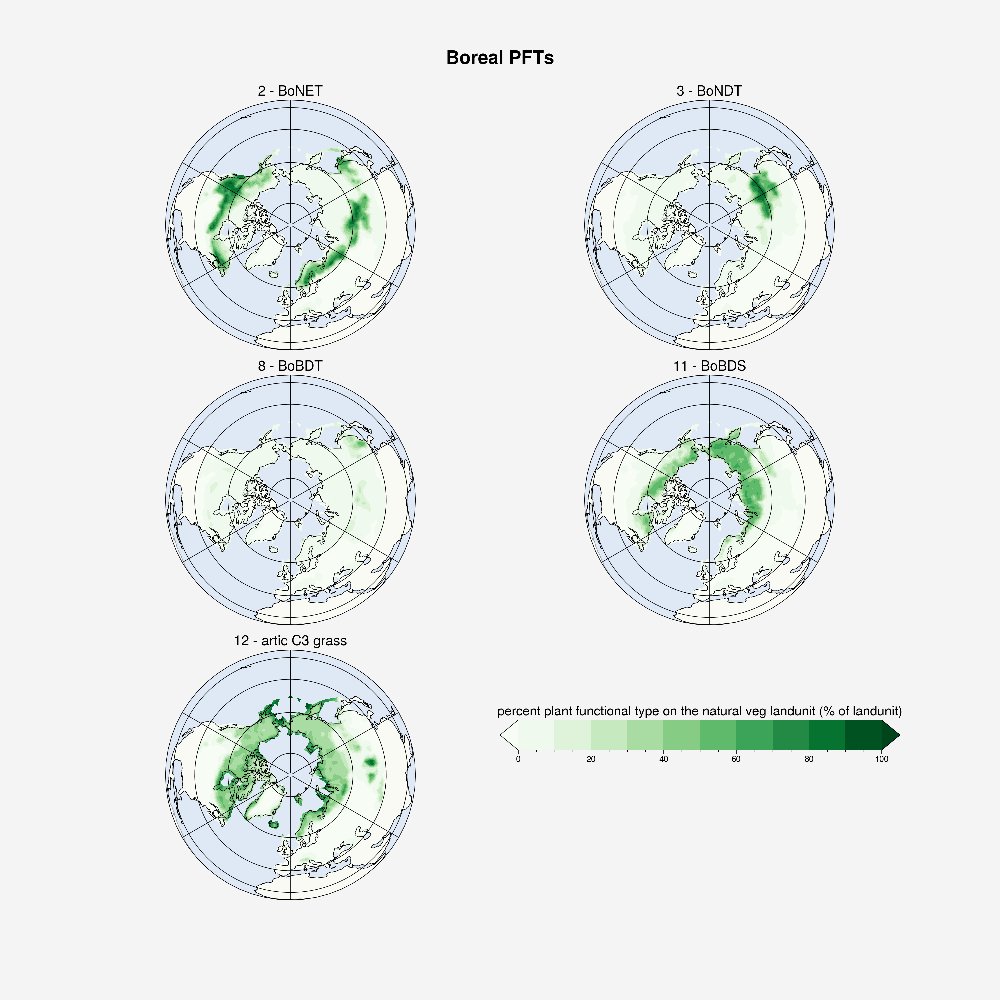

In [13]:
plot_boreal_pfts(boreal_pfts)

### <div class="alert alert-info">Comments:</div>
- **Cut an area of the map**: `ax.set_extent([-180,180, 40,90], crs = ccrs.PlateCarree())`
- **Cut Orthographic projection**: Here the [code](https://scitools.org.uk/cartopy/docs/latest/gallery/lines_and_polygons/always_circular_stereo.html#sphx-glr-gallery-lines-and-polygons-always-circular-stereo-py).
- Change **title properties of an axis**: `ax.title.set_size(15)` and `ax.title.set_position([0.5,1.5])`. Here [doc](https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.axes.Axes.set_position.html). Where with `plt.rc('font', size=SMALL_SIZE)` you change the default settings.

## <div class="alert alert-success">Dominant vegetation </div>

## Dominant boreal PFTs

In [14]:
da_pfts = boreal_pfts.where(lnd_frac>0.4)
title = "Dominant Boreal PFTs"
col_dict={2:"pine green",3:"moss",8:"dark grass green",11:"swamp green",12: "mustard green"}
labels = np.array(['BoNET','BoNDT','BoBDT','BoBDS', 'arcticC3'])
proj=ccrs.Orthographic(0, 90)
extent = [-180, 180, boreal_lat, 90]

plot_dominant_vegetation(da_pfts, title, col_dict, labels, proj, extent, figsize=[12,11])

TypeError: projection must be a string, None or implement a _as_mpl_axes method. Got [-180, 180, 40.0, 90]

<Figure size 1200x1100 with 0 Axes>

### Comparison with other two papers
1. The Boreal Climate: https://doi.org/10.1007/978-3-642-18948-7_8
2. High latitude vegetation changes will determine future plant volatile impacts on atmospheric organic aerosols: https://doi.org/10.21203/rs.3.rs-1143422/v1

In [ ]:
img_A = imread('img/boreal_ecosystems.png')
img_B = imread('img/LPJ-GUESS.png')

fig, axes = plt.subplots(1,2, figsize=[13,7])
axes[0].imshow(img_A)
axes[1].imshow(img_B)
for i in range(2):
    axes[i].grid(False)
    axes[i].set_xticks([])
    axes[i].set_yticks([])

plt.tight_layout()
plt.show()

### <div class="alert alert-info">Comments:</div>

- Default images with grid and ticks as in PlateCaree projection - how to change it: `ax.grid(False)`, `ax.set_xticks([])`, `ax.set_yticks([])`.

### Total PFT dominant vegetation

In [ ]:
da_pfts = pfts.where(pfts.natpft>0.).where(lnd_frac>0.5)
title = "Dominant PFTs"
col_dict={0:'black', 1:"deep blue",2:"pine green",3:"moss", 4:"orange9", 5:"indigo blue", 
          6:"orange5", 7:"cornflower", 8:"dark grass green", 9:"royal purple", 
          10:"purple blue", 11:"swamp green", 12: "mustard green", 13:"bronze", 14:"gold"}
labels = np.array(['BG','TeNET','BoNET','BoNDT','TrBET', 'TeBET', 'TrBDT', 'TeBDT','BoBDT','TeBES', 'TeBDS', 'BoBDS', 'arcticC3', 'C3', 'C4'])
proj=ccrs.Orthographic(0, 90)
extent = [-180, 180, boreal_lat, 90]

plot_dominant_vegetation(da_pfts, title, col_dict, labels, proj, extent, figsize=[12,11])

plot_dominant_vegetation(da_pfts, title, col_dict, labels)

## Dominant PFTs based on LAI

In [ ]:
lai = dset_in.MONTHLY_LAI.mean(dim='time', keep_attrs=True).where(lnd_frac>0.)
lai = lai.isel(lsmpft=slice(0,15)).rename({'lsmpft': 'natpft'}) #selection of just natpft (no ctf)
lai = lai.assign_coords({'natpft': lai.natpft}) #natpft: from dim to coord
lai_basic = lai
lai = pfts/100.*lai
lai = lai.assign_attrs(lai_basic.attrs); lai=lai.rename(lai_basic.name)
lai.plot(col='natpft', col_wrap=5, robust=True); plt.show()

In [ ]:
da_pfts = lai.where(lnd_frac>0.5)
title = "Dominant PFTs based on LAI"
plot_dominant_vegetation(da_pfts, title, col_dict, labels)

proj=ccrs.Orthographic(0, 90)
extent = [-180, 180, boreal_lat, 90]
plot_dominant_vegetation(da_pfts, title, col_dict, labels, proj, extent, figsize=[12,11])

### <div class="alert alert-danger"> MONTHLY_LAI needs to be weighted by the occurrence PCT_NAT_PFT </div>

In [ ]:
da_pfts = lai_basic.where(lnd_frac>0.5)
title = "Dominant PFTs based on LAI"
plot_dominant_vegetation(da_pfts, title, col_dict, labels)

proj=ccrs.Orthographic(0, 90)
extent = [-180, 180, boreal_lat, 90]
plot_dominant_vegetation(da_pfts, title, col_dict, labels, proj, extent, figsize=[12,11])

### Check over lat distribution

In [ ]:
def latitude_plot(da, title):
    da_lat = da.mean('lon')

    fig, ax = plt.subplots(figsize=[12,7])
    for n in da_lat.natpft.values:
        da_lat.where(da_lat>0.).sel(natpft=n).plot(ax=ax,label='natpft - '+str(n), color=col_dict[n])#,col='natpft', col_wrap=5) 
    ax.set_title(title)
    plt.legend(labels,loc='upper right', ncol=2)
    plt.show()

latitude_plot(lai_basic, "Latitude distribution of MONTHLY_LAI")
latitude_plot(lai, "Latitude distribution of MONTHLY_LAI weighted over PFT distribution")
latitude_plot(pfts/100., "PFT distribution")

## <span style="color:red">CRAZY TO BELIEVE!</span>
"*Prescribed PFT leaf area index is derived from the MODIS satellite data of Myneni et al. (2002) using the de-aggregation methods described in Lawrence and Chase (2007) (section 2.2.3)* " From [CLM documentation](https://escomp.github.io/ctsm-docs/versions/release-clm5.0/html/tech_note/Ecosystem/CLM50_Tech_Note_Ecosystem.html#surface-data)

### <div class="alert alert-info">Comments:</div>
- I struggled a lot in rendering **discrete color mapping**. The code is [here](https://stackoverflow.com/questions/14777066/matplotlib-discrete-colorbar), in order to have the legend like this: discrete colors, labels that are names, not an even distant number scale. Look at the link to see all the struggles but also the possibilities that can be pursue (that I pursued...).

- [**List of possible plots with Matplotlib**](https://matplotlib.org/basemap/users/examples.html) and others are [here](https://matplotlib.org/stable/plot_types/index.html):
    - `contour()`: draw contour lines.
    - `contourf()`: draw filled contours.
    - `imshow()`: draw an image.
    - `pcolor()`: draw a pseudocolor plot.
    - `pcolormesh()`: draw a pseudocolor plot (faster version for regular meshes).
    - `plot()`: draw lines and/or markers.
    - `scatter()`: draw points with markers.
    - `quiver()`: draw vectors.
    - `barbs()`: draw wind barbs.
    - `drawgreatcircle()`: draw a great circle.
- Looking around I also found what is a **choropleth maps**: maps with colored polygons. Here the [code in Python with Ploty](https://plotly.com/python/choropleth-maps/)
- **Customize colorbar**: making it discrete, not equidistant, different palettes. [Here](https://matplotlib.org/stable/tutorials/colors/colorbar_only.html).
- Always check **Proplot** that could have the solution. [Here](https://proplot.readthedocs.io/en/stable/colors.html) are the list of the **color names**.
- Add longitude and latitude coordinates in PlateCarree projection: `ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True)`
- **Max dropping nan values**: `np.nanmax()`
- **Remove nan values from Numpy array**: `x = x[~numpy.isnan(x)]`
- **Set figsize**: `fig.set_size_inches(width,height)`

## <div class="alert alert-success">Digression: LANDFRAC_PFT, AREA, NAT_PFT_VEG, NAT_PFT_ABS</div>

Note: The variable PCT_NAT_PFT is a percentage of each PFT on a land unit. But the land can also not cover the whole grid cell and at the same time the area of each grid cell is not the same (the Earth is a sphere...). So in order to have the absolute ammount of PFTs we need to consider other variables: LANDFRAC_PFT (fraction of land on a grid cell, based on PFT data) and AREA (area in $m^2$ of each grid cell).

In [ ]:
variables = ['PCT_NAT_PFT', 'PCT_NATVEG', 'LANDFRAC_PFT', 'AREA']
dset_pft = dset_in[variables]

fig, axes = plt.subplots(2,2,figsize=(13, 8), sharex= True, sharey=True,subplot_kw=dict(projection=ccrs.PlateCarree()))

cmaps=['Greens', 'oranges', 'purples']
#plt.tight_layout()
for i, ax in enumerate(axes.flat):
    if i<3:
        d=dset_pft.drop('PCT_NAT_PFT')[variables[i+1]]
        d.where(d>0.).plot.pcolormesh(ax=ax, cmap=cmaps[i])
        ax.set_global()
        ax.coastlines()
        ax.set_title(variables[i+1])
        ax.set_aspect('auto')
    else:
        ax=plt.subplot(224,projection='3d')
        dset_pft.AREA.plot.surface(ax=ax, cmap=cmaps[-1])
        ax.set_title(variables[-1])

plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.05, hspace=0.07)
    
plt.show()

## PCT_NAT_PFT ≠ PCT_NATVEG

**Solution**: in the BG of the PCT_NAT_PFT are included PCT_GLACIER and CROP. CROP is instead excluded in PCT_NATVEG.

In [ ]:
a = dset_in.PCT_NAT_PFT.sel(natpft=slice(1,14)).fillna(0.).sum('natpft', keep_attrs=True)
b = dset_in.PCT_NATVEG
diff=a-b
c = dset_in.PCT_NAT_PFT.fillna(0.).sum('natpft', keep_attrs=True)
d = dset_in.PCT_GLACIER
#e = dset_in.PCT_SAND.mean('nlevsoi')
diff2=100-d
diff3=diff2-b
crop=dset_in.PCT_CROP

fig, axes = plt.subplots(2,3,figsize=(18, 8), sharex= True, sharey=True, subplot_kw=dict(projection=ccrs.PlateCarree()))

plt.tight_layout()

axf=axes.flat
a.where(lnd_frac>0.).plot.pcolormesh(ax=axf[0], cmap='Greens', cbar_kwargs=dict(shrink=0.8)) #axes[0,0]
axf[0].set_title("SUM of PCT_NAT_PFT")
b.where(lnd_frac>0.).plot.pcolormesh(ax=axf[1], cmap='Greens', cbar_kwargs=dict(shrink=0.8))
axf[1].set_title("PCT_NATVEG")
diff2.where(lnd_frac>0.).plot.pcolormesh(ax=axf[3], cmap='Greens', cbar_kwargs=dict(shrink=0.8))
axf[3].set_title("SUM_PFT + BG - PCT_GLACIER")
crop.where(lnd_frac>0.).plot.pcolormesh(ax=axf[5], cmap='oranges', cbar_kwargs=dict(shrink=0.8))
axf[5].set_title("CROP")
diff.where(lnd_frac>0.).plot.pcolormesh(ax=axf[2], cmap='RdBu_r', cbar_kwargs=dict(shrink=0.8))
axf[2].set_title("Difference: SUM_PFT - NATVEG")
diff3.where(lnd_frac>0.).plot.pcolormesh(ax=axf[4], cmap='RdBu_r', cbar_kwargs=dict(shrink=0.8))
axf[4].set_title("Difference: SUM_PFT-GLC - NATVEG")

for i, ax in enumerate(axes.flat):
    ax.set_global()
    ax.coastlines()
    ax.set_aspect('auto')
    
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.05, hspace=0.07)

plt.show()

## From PerCenTage to ABSolute values: ABS_NAT_PFT, ABS_NATVEG

In [ ]:
dset_pft['ABS_NAT_PFT']=(dset_in.PCT_NAT_PFT*dset_in.LANDFRAC_PFT*dset_in.AREA)
dset_pft['ABS_NAT_VEG']=(dset_in.PCT_NATVEG*dset_in.LANDFRAC_PFT*dset_in.AREA)
display(dset_pft)

##### For visualization:
abspft=dset_pft.ABS_NAT_PFT
abspft.sum('natpft', keep_attrs=True).where(lnd_frac>0.).plot(cmap='Greens', robust=True, figsize=[10,5])
plt.suptitle("Absolute quantity of PFT sum in m2")
plt.show()

### <div class="alert alert-info">Comments:</div>

- **select Data Variables** in Dataset: `ds[list_of_variables]`
- filter **repetition in an array**: `np.unique` or in a list `list(dict.fromkeys(mylist))`
- there problems when rendering **projections in subplots**: `tight_layout()` doesn't work --> `plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.05, hspace=0.07)`. This is the best, or you can try 'pre-poning' `tight_layout()` or change the `ax.set_aspect(2) #'auto')`
- while if I want to make all the single **axis fit in the figure**: `plt.gca().set_position([0, 0, 1, 1])`
- **projection on subplots Xarray**: `subplot_kw=dict(projection=ccrs.PlateCarree())`. This is needed then one can also add it in the singular plots: `transform=ccrs.PlateCarree()`.
- **change projection of an axis**: `ax=plt.subplot(224,projection='3d')`. Here inspiration for [3d surface maps](https://problemsolvingwithpython.com/06-Plotting-with-Matplotlib/06.16-3D-Surface-Plots/)
- **select an interval of coordinate**: `sel(natpft=slice(1,14))`
- when subplots are a multidimensional ARRAY(!):  `axes[0,0]` or **flat the axis**`axf=axes.flat` `axf[0]`. This second solution is much better if you want to change configuration/organisation of subplots.
- change attribute of colorbar: `cbar_kwargs=dict(shrink=0.8)` directly in `dset.plot()`.
- **moltiplication element by element** (simple as): `a*b` VS matrix moltiplycation: `a @ b`
- **background color on NaN values**: `ax.set_facecolor('red')`
- create support axis: `ax=plt.axes()`
- <span style="color:red">**OBS!** when `xr.sum` **ALWAYS** `keep_attrs=True`</span>
- <span style="color:red">**OBS!** when masking and summing up, **NEVER filter PRE sum - skipna=False**. But first sum and then filter.</span>

### Latitude distribution - Nat PFTs

In [ ]:
pfts_lat = pfts.mean('lon')
pfts_lat.plot(y='lat',col='natpft', col_wrap=5) 
#not to be influenced by the too many NaN values on the lon but it's not correct:
#.where(pfts>0.).dropna('lon', how='all') 
plt.suptitle("Latitude distribution", y=1)
plt.tight_layout()
plt.show()

### Longitude distribution - Nat PFTs

In [ ]:
pfts_lon = pfts.mean('lat')
pfts_lon.plot(col='natpft', col_wrap=5)
plt.suptitle("Longitude distribution", y=1)
plt.tight_layout()
plt.show()

### ABSolute distribution of PFTs
Note: the borders are less because of the contribution of `LANDFRAC_PFT` on the single cell (so indirectly due to griding).

In [ ]:
fig, axes = plt.subplots(1,2,figsize=(15, 5), sharex= True, sharey=True, 
                         subplot_kw=dict(projection=ccrs.PlateCarree()))
#plt.tight_layout()
dset_pft.ABS_NAT_VEG.where(lnd_frac>0.).plot(ax=axes[0], cbar_kwargs=dict(label="m^2"))
axes[0].set_title("ABS_NAT_VEG")
dset_pft.ABS_NAT_PFT.sum('natpft', keep_attrs=True).where(lnd_frac>0.).plot(ax=axes[1], cbar_kwargs=dict(label="m^2"))
axes[1].set_title("ABS_NAT_PFT")
for i, ax in enumerate(axes.flat):
    ax.set_global()
    ax.coastlines()
    ax.set_aspect('auto')

plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.05, hspace=0.07)
plt.show()

dset_pft.ABS_NAT_PFT.where(lnd_frac>0.).plot(col='natpft', col_wrap=4, robust=True, figsize=[15,10], 
                               cbar_kwargs=dict(shrink=0.8))
plt.show()

## <div class="alert alert-success">Appendix B: exploring Xarray</div>
Here are notes and code that I used to train and find my way.

### Merge several Dataset, DataArray
**NOTE:** to combine DataArrays, you need to rename the variables

In [ ]:
pfts_analysis = xr.merge([pfts, pfts_lat.rename('mean_lat'), pfts_lon.rename('mean_lon')])
pfts_analysis

### Positioning specs of GridSpec
Here is a [user guide](https://matplotlib.org/stable/tutorials/intermediate/arranging_axes.html). Try to change several position to understand better.

In [ ]:
#pfts_lat = pfts.mean('lon')
#pfts_lon = pfts.mean('lat')

n=14
fig = plt.figure(figsize=(7, 3))
grid = plt.GridSpec(ncols=5, nrows=4, hspace=0.2, wspace=0.2)

#### Try to change here:
main_ax = fig.add_subplot(grid[:-1, 1:-1])
#######################
pfts.where(pfts>0.).sel(natpft=n).plot(ax=main_ax, add_colorbar=False, cmap='Greens')

#### Try to change here:
lat_ax = fig.add_subplot(grid[:-1, 0], sharey=main_ax, ylabel='Latitude [°]') #xticklabels=[],
##########################

df = pfts_lat.sel(natpft=n).drop('natpft').rename('Latitude [°]').to_series().rename_axis('')
base = plt.gca().transData
rot = transforms.Affine2D().rotate_deg(90)
reflect_vertical = transforms.Affine2D(np.array([[1, 0, 0], [0, -1, 0], [0, 0, 1]]))
df.plot(kind='area', ax=plt.gca(),transform= reflect_vertical + rot + base, stacked=False, color='g',xlim=(0, pfts_lat.sel(natpft=n).max()+3), ylim=(-90,90))
plt.gca().invert_xaxis()

#### Try to change here:
lon_ax = fig.add_subplot(grid[-1, 1:-1], sharex=main_ax) #yticklabels=[], 
###########################
pfts_lon.sel(natpft=n).to_series().plot(kind='area',ax=lon_ax, stacked=False, color='g', ylim=(0,pfts_lon.sel(natpft=n).max()+3))
lon_ax.invert_yaxis()

#### Try to change here:
color_ax = fig.add_subplot(grid[:-1,-1])
########################

### Mask

### <div class="alert alert-info">Comments:</div>
<span style="color:red">**OBS!** when masking and summing up, **NEVER filter PRE sum - skipna=False**. But first sum and then filter.</span>

In [ ]:
##### Mask NaN or 0 values ####
pfts_b=pfts.sel(natpft=bpfts)
pfts_b_mask=pfts_b.where(pfts_b>0.) #pfts_b_mask.plot(col='natpft'); plt.show()
pfts_b_sum=pfts_b.sum('natpft')

##### Mask with land fraction ####
fig, axes = plt.subplots(1,2,figsize=(10, 3), subplot_kw=dict(projection=ccrs.PlateCarree()))

pfts_b_sum.where(pfts_b_sum>0.).plot.contourf(ax=axes[0]); axes[0].set_title("Mask NaN/0 values")
pfts_b_sum.where(lnd_frac>0.).plot.contourf(ax=axes[1]); axes[1].set_title("Mask lnd_frac values")
for i, ax in enumerate(axes.flat):
    ax.set_global()
    ax.coastlines()
    ax.set_aspect('auto')
    ax.set_facecolor('red')
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.9, wspace=0.05, hspace=0.07)
plt.show()

###### xr.sum skipna=False ####
pfts_b_sumM=pfts_b_mask.sum('natpft')
pfts_b_sumF=pfts_b_mask.sum('natpft', skipna=False)
pfts_b_sumT=pfts_b_mask.sum('natpft', skipna=True)

fig, axb = plt.subplots(2,2,figsize=(10, 5), subplot_kw=dict(projection=ccrs.PlateCarree()))
axes=axb.flat
pfts_b_sumM.plot(ax=axes[0]); axes[0].set_title("Filter PRE sum - skipna=None/True")
pfts_b_sumF.plot(ax=axes[1]); axes[1].set_title("Filter PRE sum - skipna=False")
pfts_b_sumM.where(pfts_b_sumM>0.).plot(ax=axes[2]); axes[2].set_title("Filter PRE&POST sum - skipna=None/True")
pfts_b_sum.where(pfts_b_sum>0.).plot(ax=axes[3]); axes[3].set_title("Filter POST sum - skipna=None/True")
for i, ax in enumerate(axes):
    ax.set_global()
    ax.coastlines()
    ax.set_aspect('auto')
plt.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.05, hspace=0.1)
plt.show()

#**OBS!** trying with Bareground, summimg up with skip_na=True, then set nan lots of more points than expected 
#--> that means that except for bareground the other natpfts have nan as values where is largely zero (like ocean).
#Good to know! skipna need to be False to avoid baised. But then where>0. (masking) need to be done later.

#pfts.isel(natpft=[0,2,3,8,11,12]).where(pfts>0.).sum('natpft', keep_attrs=True, skipna=False).plot(); plt.show()

## Exploring Xarray Dataset
### WETLAND

<span style="color:red">**OBS!** WETLAND IS NOT COMPLEMENTARY OF LANDFRANCTION</span>

WETLAND is "ON" if 100% of the grid cell is ocean.

In [ ]:
fig, axes = plt.subplots(1,2,figsize=(10, 3), subplot_kw=dict(projection=ccrs.PlateCarree()))
dset_in.PCT_WETLAND.plot(ax=axes[0]); axes[0].set_title("PCT_WETLAND")
dw=dset_in.PCT_WETLAND/100.+dset_in.LANDFRAC_PFT
dw.plot(ax=axes[1]); axes[1].set_title("PCT_WETLAND + LANDFRAC_PFT")
for i, ax in enumerate(axes.flat):
    ax.set_global()
    ax.coastlines()
    ax.set_aspect('auto')
plt.show()

In [ ]:
# Look number values in the arrays of WETLAND and LANDFRAC
print("Values of WETLAND:", np.unique(dset_in.PCT_WETLAND).shape, ": ", np.unique(dset_in.PCT_WETLAND))
print("Values of LANDFRAC:", np.unique(dset_in.LANDFRAC_PFT).shape, ":", np.unique(dset_in.LANDFRAC_PFT))

### SAND
? I dont really understand this variable: ? layers very simular, ? non-zero values in the ocean...

In [ ]:
dset_in.PCT_SAND.where(lnd_frac>0).plot(col='nlevsoi', col_wrap=5, figsize=[15,6])
plt.suptitle("SOIL"); plt.show()

## <div class="alert alert-success">Appendix C: exploring around - basics</div>
Here are some basics

#### CMAP list
Options are: 'magma', 'inferno', 'plasma', 'viridis', 'cividis', 'twilight', 'turbo', 'blues', 'brbg', 'bugn', 'bupu', 'cmrmap', 'gnbu', 'greens', 'greys', 'orrd', 'oranges', 'prgn', 'piyg', 'pubu', 'pubugn', 'puor', 'purd', 'purples', 'rdbu', 'rdgy', 'rdpu', 'rdylbu', 'rdylgn', 'reds', 'spectral', 'wistia', 'ylgn', 'ylgnbu', 'ylorbr', 'ylorrd', 'afmhot', 'autumn', 'binary', 'bone', 'brg', 'bwr', 'cool', 'coolwarm', 'copper', 'cubehelix', 'flag', 'gist_earth', 'gist_gray', 'gist_heat', 'gist_ncar', 'gist_rainbow', 'gist_stern', 'gist_yarg', 'gnuplot', 'gnuplot2', 'gray', 'hot', 'hsv', 'jet', 'nipy_spectral', 'ocean', 'pink', 'prism', 'rainbow', 'seismic', 'spring', 'summer', 'terrain', 'winter', 'accent', 'dark2', 'paired', 'pastel1', 'pastel2', 'set1', 'set2', 'set3', 'tab10', 'tab20', 'tab20b', 'tab20c', 'blues6', 'fes', 'lapaz', 'boreal', 'browns1', 'blues7', 'lisbon', 'berlin', 'blues5', 'browns3', 'davos', 'batlowk', 'turbid', 'acton', 'browns2', 'haline', 'imola', 'batlow', 'deep', 'browns6', 'greens3', 'browns7', 'icefire', 'purples1', 'roma', 'algae', 'blues3', 'fire', 'browns5', 'greens1', 'browns4', 'blues2', 'greens8', 'reds2', 'speed', 'bamo', 'greens6', 'monocycle', 'reds3', 'cork', 'reds1', 'marine', 'lajolla', 'crest', 'tempo', 'bam', 'bamako', 'reds4', 'turku', 'thermal', 'reds5', 'glacial', 'curl', 'negpos', 'bukavu', 'oslo', 'vanimo', 'romao', 'vik', 'vlag', 'sunrise', 'sunset', 'oxy', 'delta', 'solar', 'div', 'yellows4', 'balance', 'drywet', 'rocket', 'blues4', 'matter', 'hawaii', 'yellows1', 'devon', 'ice', 'buda', 'broco', 'amp', 'yellows2', 'dusk', 'broc', 'yellows3', 'greens5', 'purples3', 'browns9', 'batloww', 'dense', 'browns8', 'purples2', 'corko', 'greens4', 'tokyo', 'oranges4', 'tofino', 'bilbao', 'phase', 'flare', 'viko', 'greens7', 'blues9', 'oranges1', 'nuuk', 'blues8', 'br', 'greens2', 'coldhot', 'oranges2', 'oleron', 'mako', 'blues1', 'oranges3', 'mono', 'stellar', 'colorblind', '538', 'classic', 'ggplot', 'qual1', 'bmh', 'qual2', 'tableau', 'default', 'colorblind10', 'flatui', 'seaborn'.

### <div class="alert alert-danger"> Open challenge: make subboreal </div>
Idea: natpft is the union of bpft, sbpft : (bpft, sbpft). but I'm way too tired today.

I know it's possible: like in dset in lsmpft.

Some websites:
- https://docs.xarray.dev/en/stable/generated/xarray.combine_by_coords.html
- https://stackoverflow.com/questions/39626402/add-dimension-to-an-xarray-dataarray
- https://docs.xarray.dev/en/v0.9.2/reshaping.html
- https://docs.xarray.dev/en/stable/user-guide/data-structures.html
- https://docs.xarray.dev/en/stable/generated/xarray.concat.html#xarray.concat

In [ ]:
#subbpfts=sbpft_trees+sbpft_grass #subbpfts.sort()
#sb1=select_boreal_region(pfts, npft=subbpfts, boreal_lat=boreal_lat, lnd_frac=lnd_frac)

#subboreal_pfts=xr.merge([boreal_pfts.rename('PCT_BOR_PFT').rename(natpft='bpft'),sb1.rename('PCT_SUBBOR_PFT').rename(natpft='sbpft')], compat='override')
#subboreal_pfts.expand_dims("natpft", ['bpft','sbpft'])

#bp1=boreal_pfts.rename('PCT_BOR_PFT').rename(natpft='bpft')
#sb2=sb1.rename('PCT_SUBBOR_PFT').rename(natpft='sbpft')
#c=xr.merge([bp1,sb2])
#c['PCT_NAT_PFT']=xr.merge([bp1,sb2], ('lon','lat'))

#xr.merge([subboreal_pfts.set_index(sbpft='natpft'),boreal_pfts.set_index(bpft='natpft')])
#xr.merge([boreal_pfts.rename(natpft='bpft'),boreal_pfts], compat='override')
#subboreal_pfts.set_index(sbpft='natpft')